In [1]:
from DataLoader import H5DataLoader
import numpy as np
import matplotlib.pyplot as plt
from pydub import AudioSegment
import os
import sys
import matplotlib.pyplot as plt
import librosa
import librosa.display
import matplotlib.cm as cm
from matplotlib.colors import Normalize

# Data Cleaning
## Loading Data from File

In [2]:
def get_file_path(identifier, person):
    data_dir = '../data/'
    # Available files
    files = os.listdir(data_dir)

    # Define the files to ignore
    files_to_ignore = ['Icon\r']

    filtered_files = [file for file in files if file not in files_to_ignore]
    print(filtered_files)
    
    # Make the search case-insensitive
    person = person.lower()
    identifier = identifier.lower()
    
    # Search for matching file
    for file in files:
        file_lower = file.lower()
        if identifier.lower() in file_lower and person.lower() in file_lower:
            print("found " + data_dir + file)
            return data_dir + file
    
    # If no match is found, return a descriptive message
    error_message = f"No recording found for identifier '{identifier}' and person '{person}'"
    print(error_message)
    return None


AUDIO_SAMPLE_RATE  =  48000 #Hz
ADC_SAMPLE_RATE    =   8000 #Hz


In [3]:
PERSON = 'jack'
IDENTIFIER = 'p3'
DATASET_PATH = get_file_path(IDENTIFIER, PERSON)

['p3JackRecording.h5']
found ../data/p3JackRecording.h5


In [4]:
loader = H5DataLoader(DATASET_PATH)
datasets = loader.list_datasets()
print("Available datasets:", datasets)


# Check data
evaldata = loader.load_dataset(datasets[0])
print("Eval Audio :", len(evaldata["audio_data"]))
print("Eval ADC channels:", evaldata["adc_data"].keys())
print("Eval ADC ch 1:", evaldata["adc_data"][1].shape)
print("Eval ADC ch 3 :", evaldata["adc_data"][3].shape)

N_audio_samples = len(evaldata["audio_data"])
N_adc_samples = len(evaldata["adc_data"][1]) + len(evaldata["adc_data"][3])
print("Eval Audio samples:", N_audio_samples)
print("Eval ADC samples:", N_adc_samples)
ratio = N_audio_samples / N_adc_samples
print("Audio to ADC ratio:", ratio)
expected_ratio = AUDIO_SAMPLE_RATE / ADC_SAMPLE_RATE
print("Expected ratio:", expected_ratio)

Available datasets: ['ace', 'aid', 'come', 'day', 'dime', 'doom', 'dude', 'key', 'make', 'may', 'moo', 'moose', 'my', 'ray', 'rock', 'rum', 'same', 'seam', 'seed', 'seek', 'shave', 'she', 'shock', 'shoe', 'shy', 'side', 'sigh', 'sue', 'they', 'us', 'vase', 'wake', 'wash', 'way', 'weed', 'why', 'woo']
Eval Audio : 1836800
Eval ADC channels: dict_keys([1, 3])
Eval ADC ch 1: (153344,)
Eval ADC ch 3 : (153344,)
Eval Audio samples: 1836800
Eval ADC samples: 306688
Audio to ADC ratio: 5.989148580968281
Expected ratio: 6.0


## Data Processing using Short-Time Energy

In [5]:
import numpy as np
import matplotlib.pyplot as plt

def short_time_energy_segmentation(audio_samples, sr, 
                                   frame_duration=0.02,    # 20 ms 
                                   hop_duration=0.01,      # 10 ms
                                   smoothing_window=5,     # in frames
                                   energy_quantile=0.2,    # quantile for threshold
                                   min_silence_frames=3,   # minimum consecutive silent frames for a silence region
                                   min_voiced_frames=3     # minimum consecutive voiced frames for a speech region
                                  ):
    """
    Perform Short-Time Energy + Adaptive Thresholding segmentation.
    
    Parameters
    ----------
    audio_samples : 1D np.array
        Audio signal samples.
    sr : int
        Sample rate of the audio (samples/sec).
    frame_duration : float
        Duration of each frame in seconds (default 20 ms).
    hop_duration : float
        Hop (overlap) between frames in seconds (default 10 ms).
    smoothing_window : int
        Number of frames for smoothing the energy contour.
    energy_quantile : float
        Which quantile of the energy distribution to use for threshold. 
        For example, 0.2 = 20th percentile.
    min_silence_frames : int
        Minimum consecutive frames that must be below threshold to be considered silence.
    min_voiced_frames : int
        Minimum consecutive frames that must be above threshold to be considered speech.
    
    Returns
    -------
    segments : list of (seg_start, seg_end)
        Detected voiced (speech) segments in sample indices.
    ste : np.array
        Short-time energy array (one value per frame).
    frame_times : np.array
        Time (seconds) at the center of each frame.
    threshold : float
        Energy threshold used for classification.
    """

    # -------------------------
    # 1) Frame Setup
    # -------------------------
    frame_size = int(frame_duration * sr)
    hop_size   = int(hop_duration   * sr)

    # Make sure audio is 1D (mono)
    audio_samples = np.asarray(audio_samples).flatten()
    n_samples = len(audio_samples)

    # -------------------------
    # 2) Compute Short-Time Energy
    # -------------------------
    energies = []
    frame_times = []  # store center time of each frame
    idx = 0
    while idx + frame_size <= n_samples:
        frame = audio_samples[idx:idx + frame_size]
        ste_value = np.sum(frame**2) / frame_size
        energies.append(ste_value)

        # Time stamp for the center of the frame
        frame_center = (idx + frame_size/2.0) / sr
        frame_times.append(frame_center)

        idx += hop_size

    energies = np.array(energies)
    frame_times = np.array(frame_times)

    # -------------------------
    # 3) Smooth the Energy
    # -------------------------
    # Simple moving average over 'smoothing_window' frames
    kernel = np.ones(smoothing_window) / smoothing_window
    ste_smoothed = np.convolve(energies, kernel, mode='same')

    # -------------------------
    # 4) Adaptive Threshold
    # -------------------------
    # Example: pick the 'energy_quantile' percentile of the STE distribution
    # to serve as a baseline. Then add a factor if needed.
    threshold_value = np.quantile(ste_smoothed, energy_quantile)
    # Optionally scale that threshold:
    threshold_value *= 2.0  # e.g., multiply by 2

    # -------------------------
    # 5) Classify Frames as Voiced / Unvoiced
    # -------------------------
    voiced_frames = ste_smoothed >= threshold_value
    
    # We might want to "cleanup" tiny silences or tiny voiced pockets:
    # * Merge short voiced segments
    # * Merge short silence segments

    # We'll do a simple pass that merges short runs below/above threshold
    def merge_labels(labels, min_count, target_value):
        """
        Merge short segments of 'target_value' if they are below min_count.
        For example, merge short runs of 1's among 0's if min_count is 3.
        """
        # labels is boolean array. True=voiced, False=silence
        # We want to ensure runs of 'target_value' have at least min_count frames.
        # If not, convert them to the opposite label.
        labels_int = labels.astype(int)
        merged = labels_int.copy()
        
        i = 0
        while i < len(labels_int):
            val = labels_int[i]
            run_start = i
            while i < len(labels_int) and labels_int[i] == val:
                i += 1
            run_end = i  # one past the end
            
            run_length = run_end - run_start
            
            if val == target_value and run_length < min_count:
                # Flip them to the opposite value
                merged[run_start:run_end] = 1 - target_value
        
        return merged.astype(bool)

    # Merge short voiced frames
    voiced_frames = merge_labels(voiced_frames, min_voiced_frames, target_value=True)
    # Merge short silence frames
    voiced_frames = merge_labels(voiced_frames, min_silence_frames, target_value=False)

    # -------------------------
    # 6) Convert Frames to Time Segments
    # -------------------------
    segments = []
    in_segment = False
    seg_start = None

    for i, vf in enumerate(voiced_frames):
        if vf and not in_segment:
            # start of a segment
            in_segment = True
            seg_start = i
        elif not vf and in_segment:
            # end of a segment
            in_segment = False
            seg_end = i - 1
            # Convert frame indices to sample indices
            # We'll map to the center time of the first and last frames,
            # then expand to sample indices.
            seg_start_time = frame_times[seg_start] - (frame_duration/2)
            seg_end_time = frame_times[seg_end] + (frame_duration/2)
            sample_start = int(max(seg_start_time, 0) * sr)
            sample_end   = int(min(seg_end_time, n_samples / sr) * sr)
            segments.append((sample_start, sample_end))

    # If ended in a voiced segment
    if in_segment:
        seg_end = len(voiced_frames) - 1
        seg_start_time = frame_times[seg_start] - (frame_duration/2)
        seg_end_time   = frame_times[seg_end] + (frame_duration/2)
        sample_start   = int(max(seg_start_time, 0) * sr)
        sample_end     = int(min(seg_end_time, n_samples / sr) * sr)
        segments.append((sample_start, sample_end))

    return segments, ste_smoothed, frame_times, threshold_value


# -----------------------------------------------------
# 1) Run Short-Time Energy + Threshold Segmentation
# -----------------------------------------------------
# segments, ste, frame_times, threshold_value = short_time_energy_segmentation(
#     evaldata["audio_data"], AUDIO_SAMPLE_RATE,
#     frame_duration=0.04,
#     hop_duration=0.1,
#     smoothing_window=6,
#     energy_quantile=0.15,
#     min_silence_frames=1,
#     min_voiced_frames=2
# )

# # -----------------------------------------------------

# # 2) Visualization
# # -----------------------------------------------------

# # 2A) Plot Short-Time Energy & Threshold
# plt.figure(figsize=(12, 4))
# plt.plot(frame_times, ste, label="Short-Time Energy")
# plt.axhline(threshold_value, linestyle='--', label=f"Threshold={threshold_value:.4f}")
# plt.title("Short-Time Energy vs. Time")
# plt.xlabel("Time (sec)")
# plt.ylabel("Energy")
# plt.legend()
# plt.grid()
# plt.show()

# # 2B) Plot the Original Waveform & Highlight Detected Segments
# plt.figure(figsize=(12, 4))
# times = np.arange(len(evaldata["audio_data"])) / AUDIO_SAMPLE_RATE
# plt.plot(times, evaldata["audio_data"], label="Waveform")
# # Overlay detected segments as colored spans
# for (start_samp, end_samp) in segments:
#     plt.axvspan(start_samp/AUDIO_SAMPLE_RATE, end_samp/AUDIO_SAMPLE_RATE, color='green', alpha=0.3)
# plt.title("Waveform with Detected 'Speech' Segments")
# plt.xlabel("Time (sec)")
# plt.ylabel("Amplitude")
# plt.xlim([0, max(times)])
# plt.legend()
# plt.grid()
plt.show()


## Generating Segments based on Short-Time Energy

Dataset: ace
Dataset: aid
Dataset: come
Dataset: day
Dataset: dime
Dataset: doom
Dataset: dude
Dataset: key
Dataset: make
Dataset: may
Dataset: moo
Dataset: moose
Dataset: my
Dataset: ray
Dataset: rock
Dataset: rum
Dataset: same
Dataset: seam
Dataset: seed
Dataset: seek
Dataset: shave


/tmp/ipykernel_24105/4195366673.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20, 10))


Dataset: she
Dataset: shock
Dataset: shoe
Dataset: shy
Dataset: side
Dataset: sigh
Dataset: sue
Dataset: they
Dataset: us
Dataset: vase
Dataset: wake
Dataset: wash
Dataset: way
Dataset: weed
Dataset: why
Dataset: woo


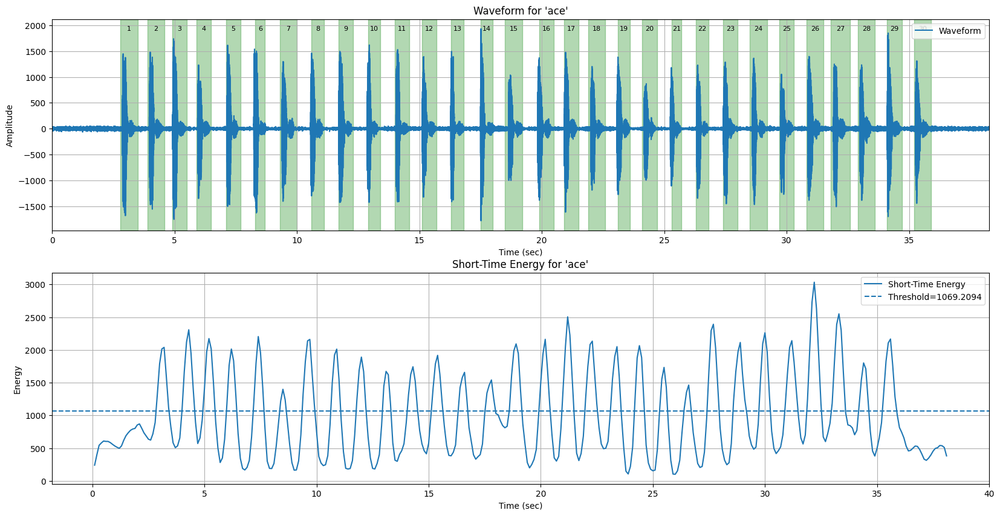

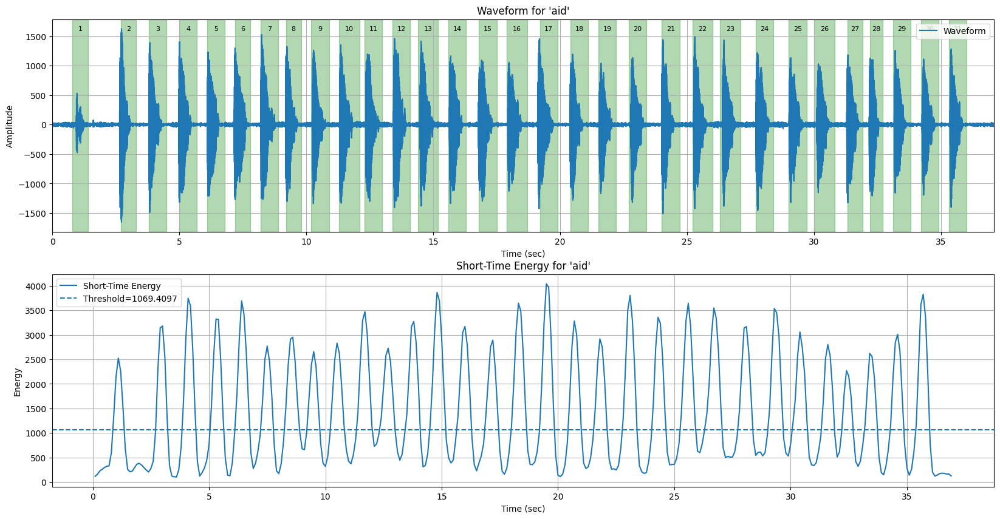

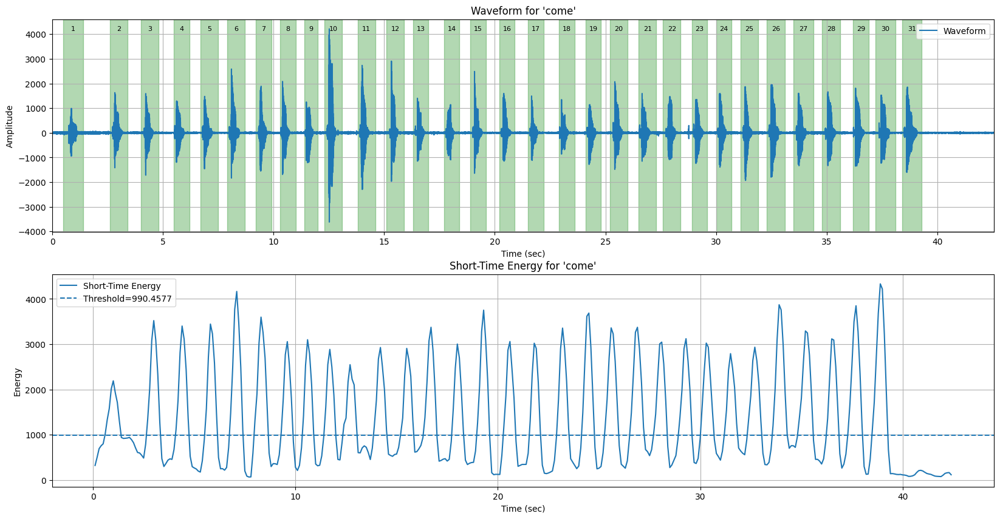

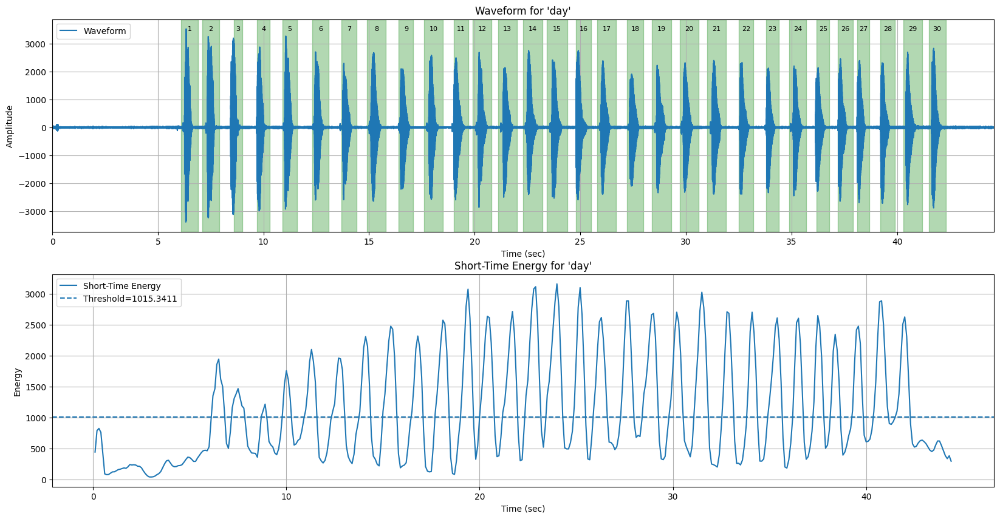

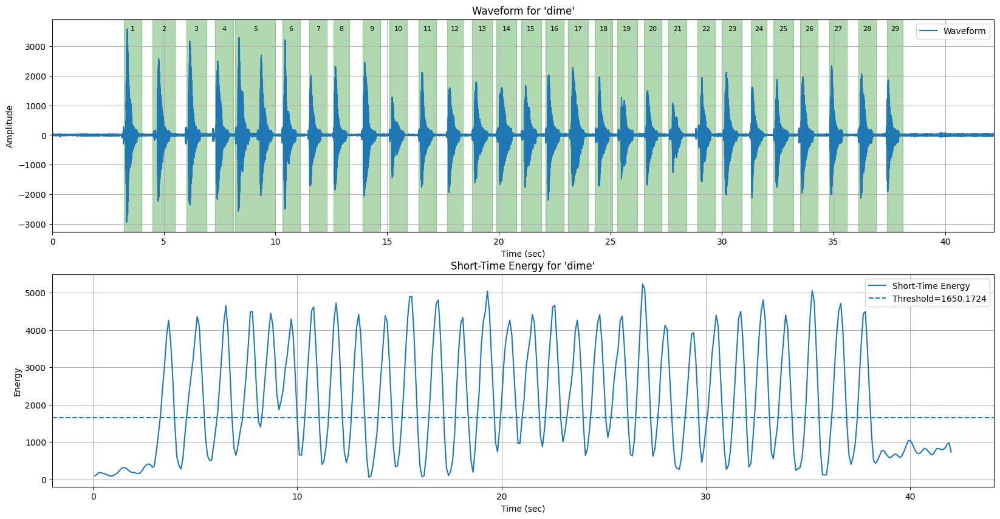

...

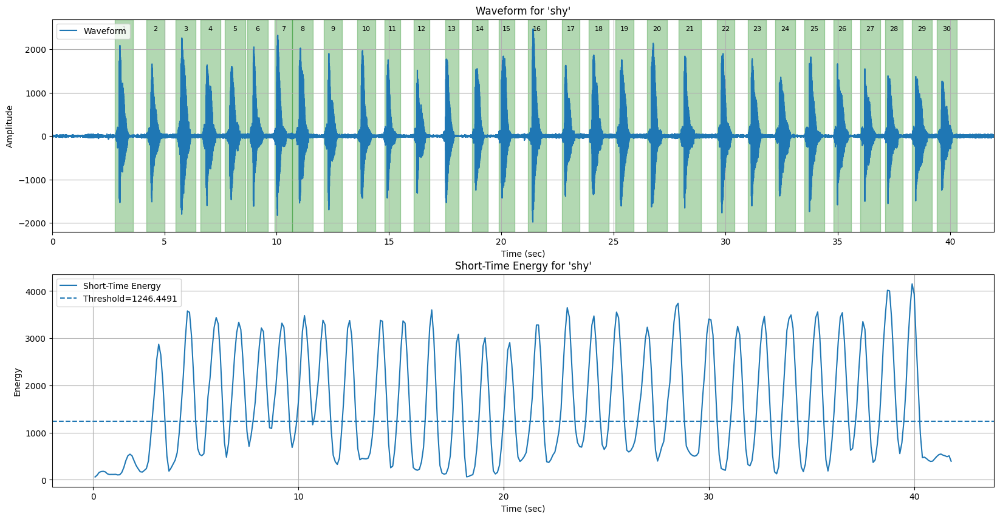

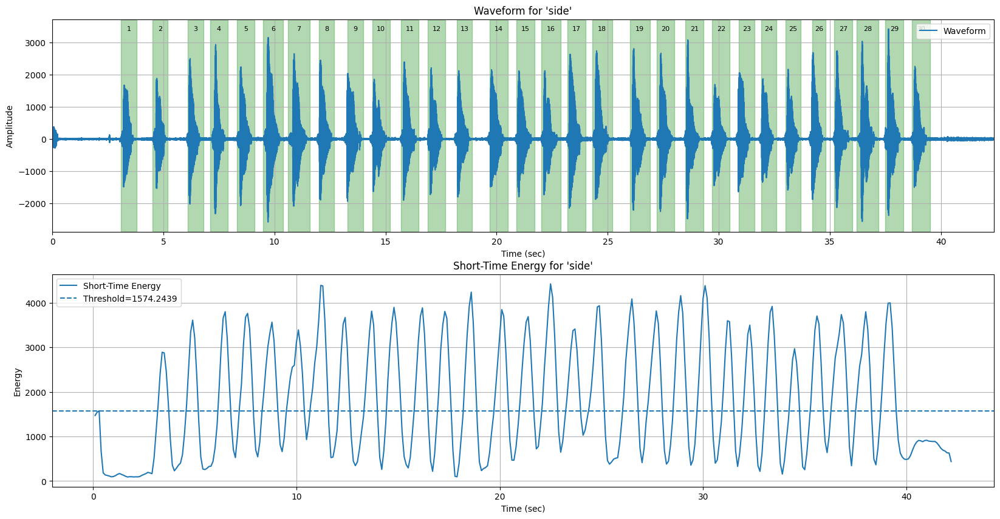

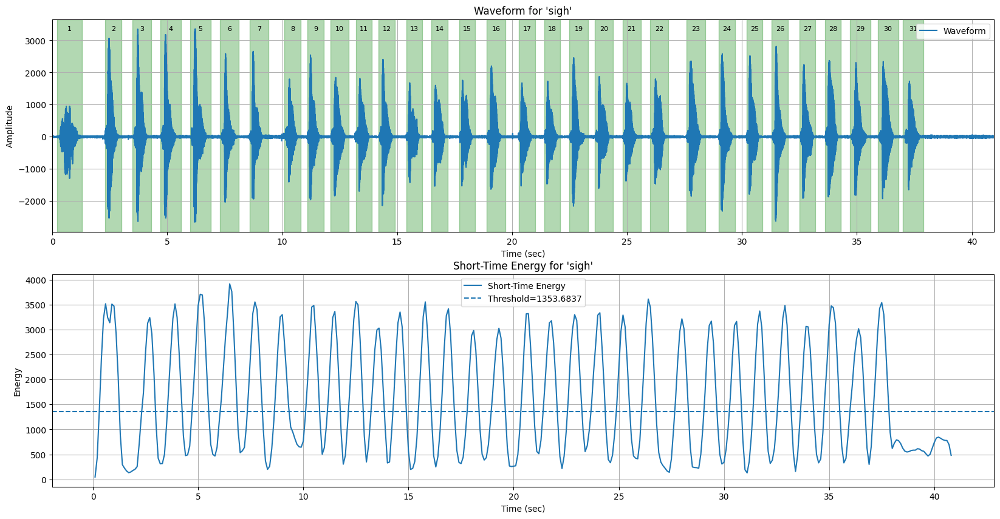

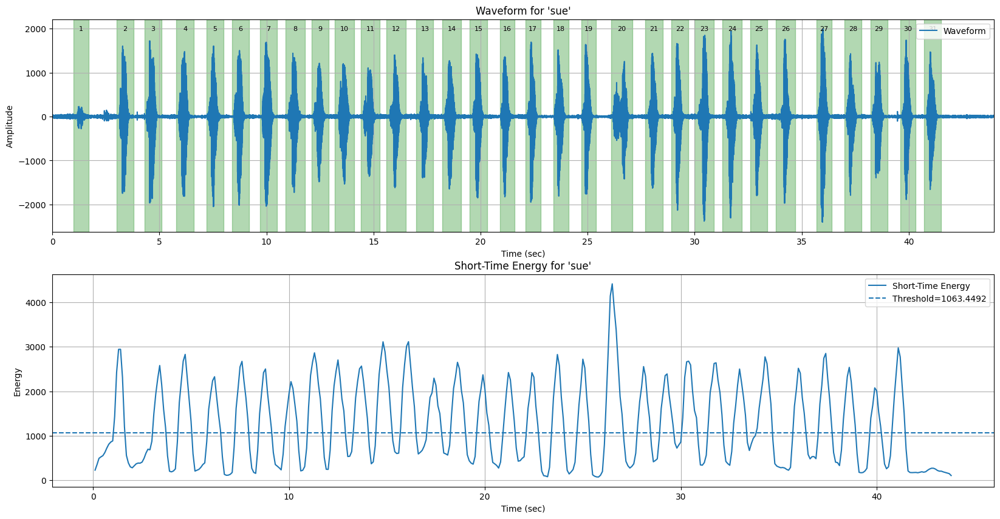

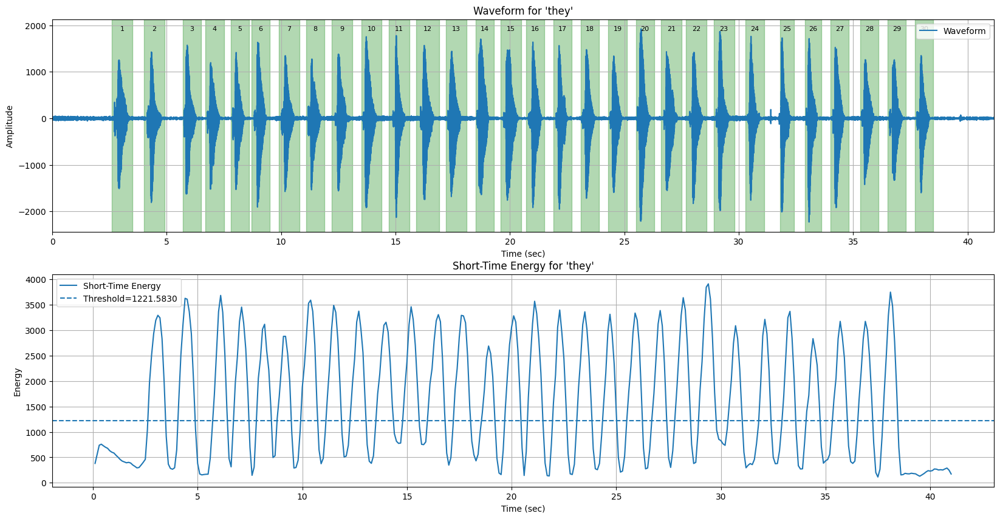

/home/nicolas/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


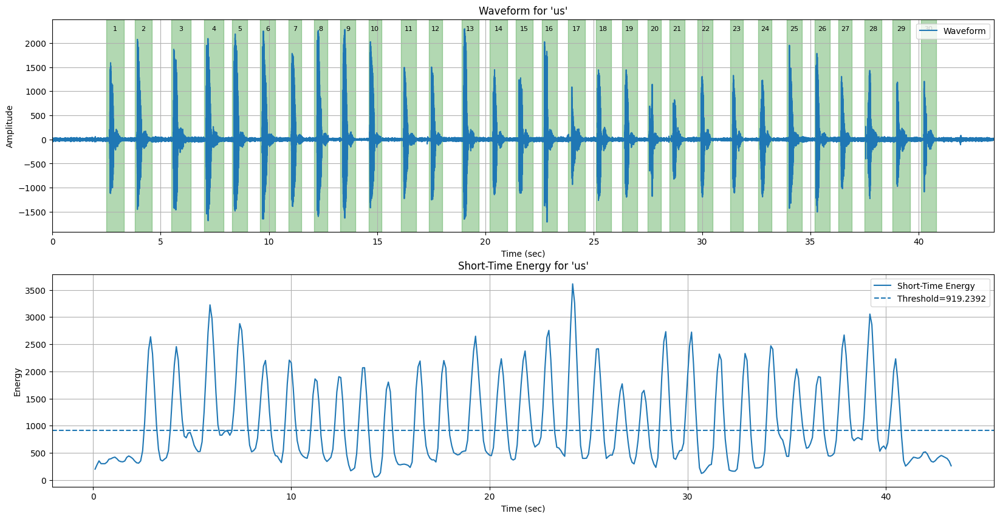

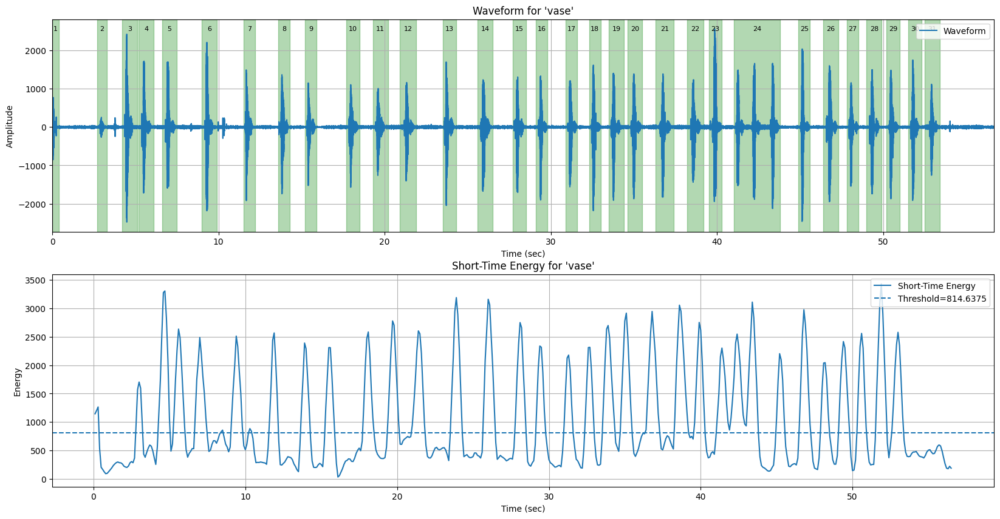

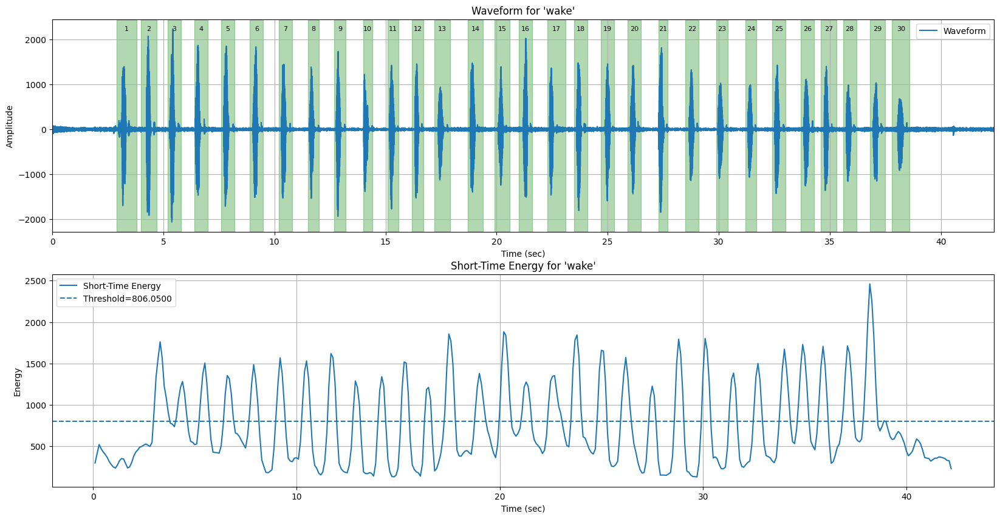

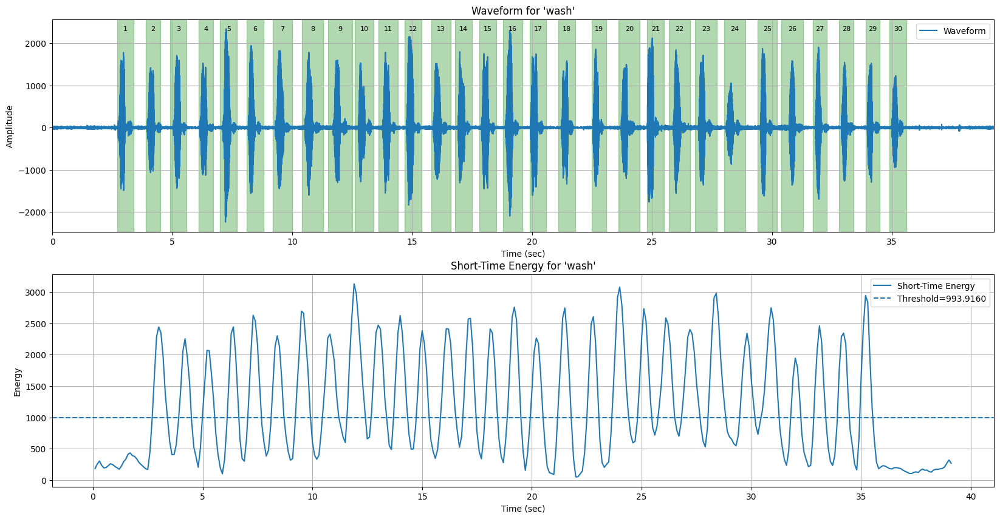

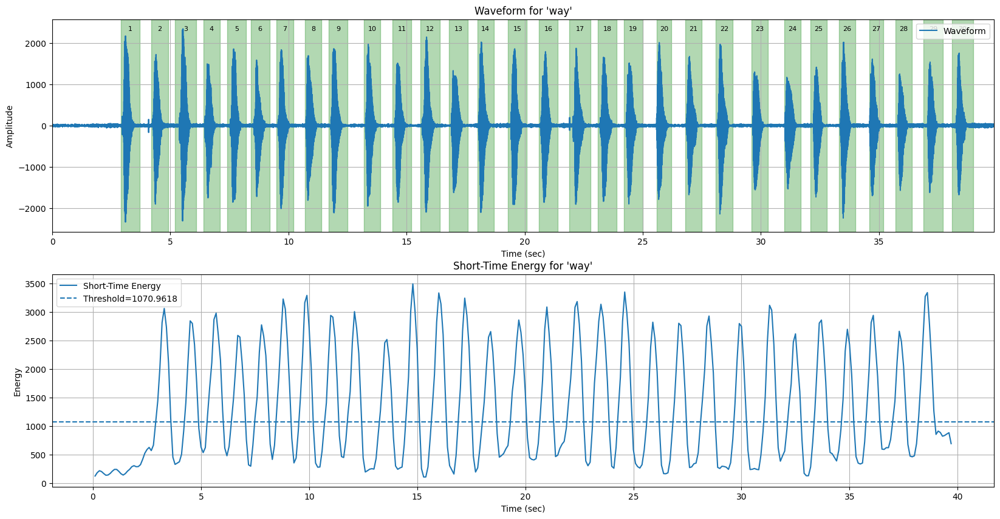

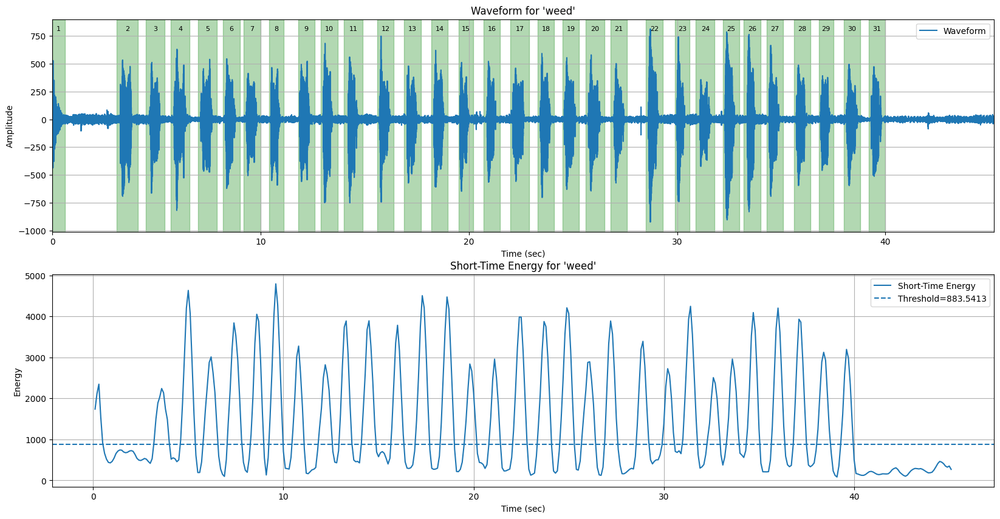

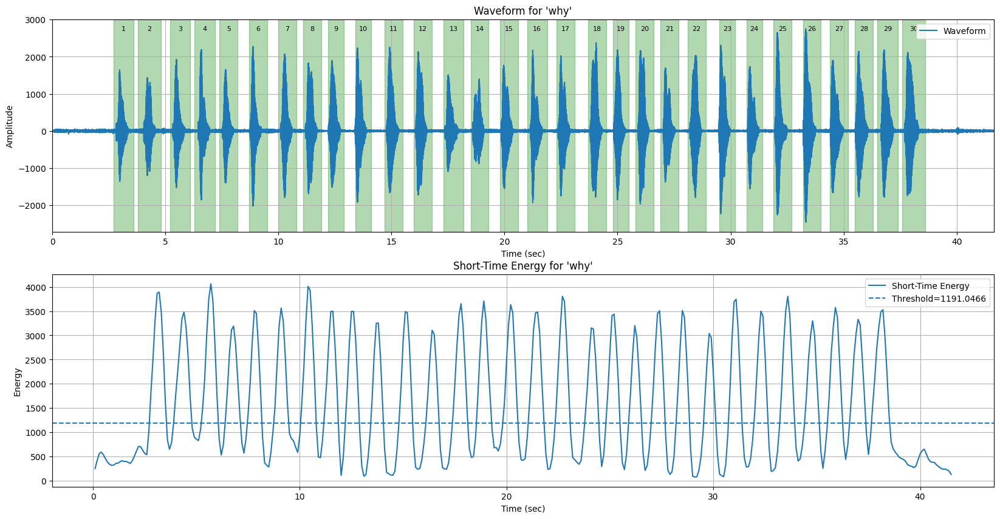

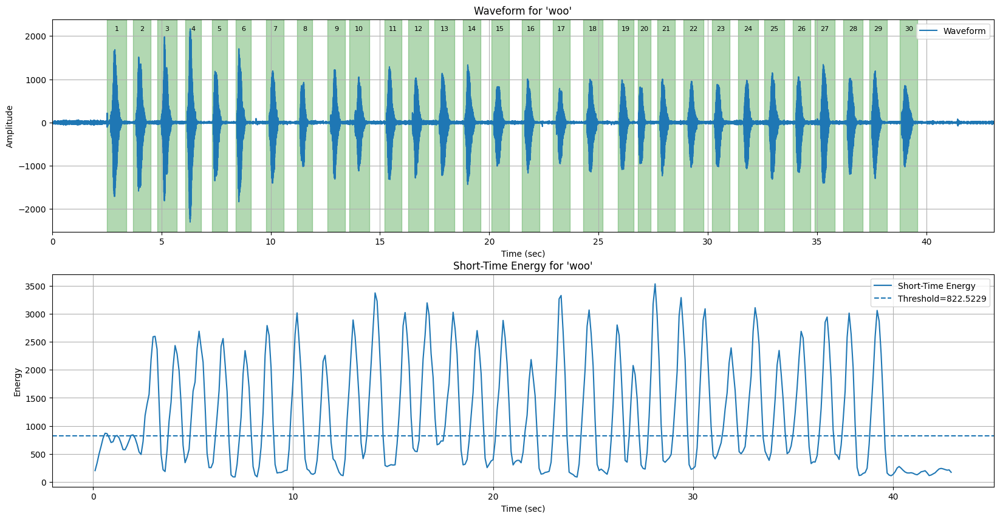

In [6]:
datasetInedex = dict()

# test it out on all the datasets
for dataset in datasets:
    print("Dataset:", dataset)
    data = loader.load_dataset(dataset)
    audio_data = data["audio_data"]
    adc_data = data["adc_data"]
    N_audio_samples = len(audio_data)
    N_adc_samples = len(adc_data[1]) + len(adc_data[3])
    # -----------------------------------------------------
    # 1) Run Short-Time Energy + Threshold Segmentation
    # -----------------------------------------------------
    segments, ste, frame_times, threshold_value = short_time_energy_segmentation(
        audio_data, AUDIO_SAMPLE_RATE,
        frame_duration=0.2,
        hop_duration=0.1,
        smoothing_window=4,
        energy_quantile=0.3,
        min_silence_frames=1,
        min_voiced_frames=3
    )
    datasetInedex[dataset] = segments
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 1, 1)
    times = np.arange(len(audio_data)) / AUDIO_SAMPLE_RATE
    plt.plot(times, audio_data, label="Waveform")
    y_text = max(audio_data)
    # Overlay detected segments as colored spans
      
    for i,(start_samp, end_samp) in enumerate(segments):
        plt.axvspan(start_samp/AUDIO_SAMPLE_RATE, end_samp/AUDIO_SAMPLE_RATE, color='green', alpha=0.3)
        plt.text(
            (start_samp + end_samp) / (2 * AUDIO_SAMPLE_RATE),
            y_text,
            f"{i+1}",
            fontsize=8,
            color='black',
            ha='center',
            va='center'
        )
    plt.title(f"Waveform for '{dataset}'")
    plt.xlabel("Time (sec)")
    plt.ylabel("Amplitude")
    plt.xlim([0, max(times)])
    plt.legend()
    plt.grid()
    plt.subplot(2, 1, 2)
    plt.plot(frame_times, ste, label="Short-Time Energy")
    plt.axhline(threshold_value, linestyle='--', label=f"Threshold={threshold_value:.4f}")
    plt.title(f"Short-Time Energy for '{dataset}'")
    plt.xlabel("Time (sec)")
    plt.ylabel("Energy")
    plt.legend()
    plt.grid()

## Identifying and Removing Bad Segments

In [7]:
def get_exclude_config(person, identifier):
    """
    Returns the exclude_indexes and exclude_datasets based on person and identifier.
    
    Args:
        person (str): Person identifier ('sam' or 'jack')
        identifier (str): Dataset identifier ('p1', 'p2', 'p3', 'OG')
    
    Returns:
        tuple: (exclude_indexes, exclude_datasets)
    """
    # Configuration dictionary mapping (person, identifier) to exclude configs
    config = {
        ### SAM
        ('sam', 'OG'): {
            'exclude_indexes': {
                'Child': [31], 
                'Joyce': [1, 30],
                'Justice': [1, 2, 3],
                'Question': [1, 17, 31],
                'Thought': [1, 29],
                'Through': [32],
                'Weapons': [32],
                'XRay2': [31],
            },
            'exclude_datasets': ['NOISE', 'NOISE2', 'NOISE3', 'XRay', 'Europe']
        },
        ('sam', 'p3'): {
            'exclude_indexes': {
                'Justice': [14, 16, 27],
                'Through': [1, 20, 28, 31], 
                'Weapons': [31],
            },
            'exclude_datasets': []
        },
        ('sam', 'p2'): {
            'exclude_indexes': {
                'Justice': [3, 22, 23, 32],
                'Through': [1, 18, 19, 30],
                'Weapons': [18, 20],
            },
            'exclude_datasets': []
        },
        ('sam', 'p1'): {
            'exclude_indexes': {
                'Justice': [1, 8],
                'Weapons': [22, 29],
            },
            'exclude_datasets': []
        },
        
        ### JACK 
        ('jack', 'p2'): {
            'exclude_indexes': {
                'Child': [1], 
                'Europe': [],
                'Exactly': [30, 31],
                'Joyce': [31],
                'Justice': [31],
                'Question': [],
                'Thought': [31],
                'Through': [1],
                'Weapons': [1],
                'XRay2': [31],
            },
            'exclude_datasets': []
        },
        ('jack', 'p3'): {
            'exclude_indexes': {
                'aid':[1],
                'come':[1],
                'doom':[1],
                'seam':[31],
                'shave':[9, 12],
                'she':[1, 2 ],
                'shock':[ 15],
                'sigh':[ 1],
                'sue':[ 1, 20],
                'vase':[ 1, 2, 24],
                'weed':[ 1],
            },
            'exclude_datasets': []
        },
    }
    
    # Convert inputs to lowercase for case-insensitive matching
    person = person.lower()
    identifier = identifier.lower()
    
    # Look up the configuration
    key = (person, identifier)
    if key in config:
        return config[key]['exclude_indexes'], config[key]['exclude_datasets']
    else:
        print(f"Warning: No configuration found for {person} and {identifier}. Using empty defaults.")
        return {}, ['NOISE', 'NOISE2', 'NOISE3', 'XRay', 'Europe']

# Usage example:
exclude_indexes, exclude_datasets = get_exclude_config(PERSON, IDENTIFIER)

In [8]:
# Filter the segments
filtered_segments = dict()
for dataset, segments in datasetInedex.items():
    if dataset in exclude_datasets:
        continue
    old_size = len(segments)
    filtered_segments[dataset] = [
        segment for i, segment in enumerate(segments) 
        if i+1 not in exclude_indexes.get(dataset, [])
    ]
    new_size = len(filtered_segments[dataset])
    print(f"Dataset: {dataset}, Old size: {old_size}, New size: {new_size}")
print(filtered_segments)


Dataset: ace, Old size: 30, New size: 30
Dataset: aid, Old size: 31, New size: 30
Dataset: come, Old size: 31, New size: 30
Dataset: day, Old size: 30, New size: 30
Dataset: dime, Old size: 29, New size: 29
Dataset: doom, Old size: 31, New size: 30
Dataset: dude, Old size: 29, New size: 29
Dataset: key, Old size: 30, New size: 30
Dataset: make, Old size: 29, New size: 29
Dataset: may, Old size: 30, New size: 30
Dataset: moo, Old size: 30, New size: 30
Dataset: moose, Old size: 30, New size: 30
Dataset: my, Old size: 31, New size: 31
Dataset: ray, Old size: 30, New size: 30
Dataset: rock, Old size: 30, New size: 30
Dataset: rum, Old size: 30, New size: 30
Dataset: same, Old size: 29, New size: 29
Dataset: seam, Old size: 31, New size: 30
Dataset: seed, Old size: 30, New size: 30
Dataset: seek, Old size: 30, New size: 30
Dataset: shave, Old size: 30, New size: 28
Dataset: she, Old size: 32, New size: 30
Dataset: shock, Old size: 29, New size: 28
Dataset: shoe, Old size: 30, New size: 30


## Confirming only Good Segments

In [9]:
def plot_dataset(dataset, segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, threshold_value=None, frame_times=None, ste=None, show_plots=True):
    """
    Plot waveform, short-time energy, and ADC data for a dataset.
    
    Parameters:
    -----------
    dataset : str
        Name of the dataset to plot
    segments : list
        List of (start_sample, end_sample) tuples for each detected segment
    loader : object
        Dataset loader object with load_dataset method
    AUDIO_SAMPLE_RATE : float
        Sample rate of audio data
    ADC_SAMPLE_RATE : float
        Sample rate of ADC data
    threshold_value : float, optional
        Threshold value for short-time energy plot
    frame_times : array-like, optional
        Time values for short-time energy frames
    ste : array-like, optional
        Short-time energy values
    show_plots : bool, default=True
        If False, the function will set up the plots but not display them,
        allowing for additional modifications or saving
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure object containing the plots
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    print("Dataset:", dataset)
    data = loader.load_dataset(dataset)
    audio_data = data["audio_data"]
    adc_data = data["adc_data"]
    N_audio_samples = len(audio_data)
    N_adc_samples = len(adc_data[1]) + len(adc_data[3])
    
    # Calculate average ADC values if needed
    avg_adc_ch1 = np.average(adc_data[1])
    avg_adc_ch3 = np.average(adc_data[3])
    
    fig = plt.figure(figsize=(20, 10))
    
    # Audio Waveform Plot
    plt.subplot(3, 1, 1)
    times = np.arange(len(audio_data)) / AUDIO_SAMPLE_RATE
    plt.plot(times, audio_data, label="Waveform")
    y_text = max(audio_data)
    
    # Overlay detected segments as colored spans
    for i, (start_samp, end_samp) in enumerate(segments):
        plt.axvspan(start_samp/AUDIO_SAMPLE_RATE, end_samp/AUDIO_SAMPLE_RATE, color='green', alpha=0.3)
        plt.text((start_samp + end_samp) / (2 * AUDIO_SAMPLE_RATE), y_text, f"{i+1}", 
                 fontsize=8, color='black', ha='center', va='center')
    
    plt.title(f"Waveform for '{dataset}'")
    plt.xlabel("Time (sec)")
    plt.ylabel("Amplitude")
    plt.xlim([0, max(times)])
    plt.legend()
    plt.grid()
    
    # Short-Time Energy Plot (if provided)
    if frame_times is not None and ste is not None:
        plt.subplot(3, 1, 2)
        plt.plot(frame_times, ste, label="Short-Time Energy")
        
        if threshold_value is not None:
            plt.axhline(threshold_value, linestyle='--', label=f"Threshold={threshold_value:.4f}")
            
        plt.title(f"Short-Time Energy for '{dataset}'")
        plt.xlabel("Time (sec)")
        plt.ylabel("Energy")
        plt.legend()
        plt.grid()
    
    # ADC Data Plot
    plt.subplot(3, 1, 3)
    times = np.arange(len(adc_data[1])) / ADC_SAMPLE_RATE
    y_text = max(adc_data[1])
    
    print(f"ADC channels: {len(adc_data[1])}, {len(adc_data[3])}")
    
    plt.plot(times, adc_data[1] - avg_adc_ch1, label="ADC Data 1")
    plt.plot(times, adc_data[3] - avg_adc_ch3, label="ADC Data 3")
    
    for i, (start_samp, end_samp) in enumerate(segments):
        plt.axvspan(start_samp/(ADC_SAMPLE_RATE*12), end_samp/(ADC_SAMPLE_RATE*12), color='green', alpha=0.3)
        plt.text((start_samp + end_samp) / (2*(ADC_SAMPLE_RATE*12)), y_text, f"{i+1}", 
                 fontsize=8, color='black', ha='center', va='center')
                 
    plt.xlabel("Sample Number")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid()
    plt.title(f"ADC Data for '{dataset}'")
    
    plt.tight_layout()
    
    if show_plots:
        plt.show()
    
    return fig

# Example usage:
# # To plot a single dataset:
# plot_dataset('Through', filtered_segments['Through'], loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, 
#              threshold_value, frame_times, ste)

# To plot all datasets:
def plot_all_datasets(filtered_segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, 
                     threshold_value=None, frame_times=None, ste=None, show_plots=False):
    """
    Plot all datasets in filtered_segments.
    
    Parameters: Same as plot_dataset, except:
    filtered_segments : dict
        Dictionary mapping dataset names to their segment lists
    """
    figures = {}
    for dataset, segments in filtered_segments.items():
        figures[dataset] = plot_dataset(dataset, segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE,
                                      threshold_value, frame_times, ste, show_plots)
    return figures

In [10]:
# plot_all_datasets(filtered_segments, loader, AUDIO_SAMPLE_RATE, ADC_SAMPLE_RATE, threshold_value, frame_times, ste)

# Filtering Signals
## Add Band-Pass Filter

In [29]:
from scipy import signal
import numpy as np
import json
import os

audiosegmentsX = []
adc1segmentsX = []
adc2segmentsX = []
segmentsY = []
audio_sampling_rate = 48000
adc_sampling_rate = 8000

# New cutoff frequencies
audio_lowcut = 300  # Low cutoff for audio (Hz)
audio_highcut = 4000  # High cutoff for audio (Hz)
adc_lowcut = 5 # Low cutoff for ADC (Hz)
adc_highcut = 3700  # High cutoff for ADC (Hz)

def BPfilter(data, fs, lowcut_hz=None, highcut_hz=None):
    """
    Apply a bandpass Butterworth filter to the input data.
    
    Parameters:
    data : array-like
        The input signal to filter
    fs : float
        Sampling frequency in Hz
    lowcut_hz : float, optional
        Lower cutoff frequency in Hz. If None, defaults to 20 Hz
    highcut_hz : float, optional
        Upper cutoff frequency in Hz. If None, defaults to fs/4 Hz
        
    Returns:
    array-like
        The filtered signal
    """
    # Default cutoff frequencies if not provided
    if lowcut_hz is None:
        lowcut_hz = 20  # Default lower cutoff of 20 Hz
    
    if highcut_hz is None:
        highcut_hz = fs/4  # Default upper cutoff at quarter of sampling rate
    
    # Convert cutoff frequencies to normalized units (0 to 1)
    nyquist = fs / 2
    low = lowcut_hz / nyquist
    high = highcut_hz / nyquist
    
    # Create a 4th-order bandpass Butterworth filter
    b, a = signal.butter(2, [low, high], btype='band')
    
    # Apply zero-phase filtering using filtfilt
    filtered_data = signal.filtfilt(b, a, data)
    # filtered_data = data
    
    return filtered_data

# data = loader.load_dataset('NOISE2')
# avg_adc_ch1 = np.average(data["adc_data"][1])
# avg_adc_ch3 = np.average(data["adc_data"][3])
id2dataset = dict()
currentid = -1

max_audio_len = max( end_samp - start_samp for segments in filtered_segments.values() for start_samp, end_samp in segments)
max_adc_len = max_audio_len // 12
n_segments = sum(len(segments) for segments in filtered_segments.values())
memmap_filename = 'p3jack.dat'
# Delete the memmap file if it already exists
if os.path.exists(memmap_filename):
    os.remove(memmap_filename)

dtype = np.dtype([
    ('id', np.int32),
    ('audio', np.float32, (max_audio_len,)),
    ('adc1',  np.float32, (max_adc_len,)),
    ('adc2',  np.float32, (max_adc_len,))
])

mm = np.memmap(memmap_filename, dtype=dtype, mode='w+', shape=(n_segments,))
iterator= 0
for dataset, segments in filtered_segments.items():
    currentid += 1
    data = loader.load_dataset(dataset)
    audio_data = data["audio_data"]
    adc_data = data["adc_data"]
    id2dataset[currentid] = dataset
    for i, (start_samp, end_samp) in enumerate(segments):
        audioblock = audio_data[start_samp:end_samp]
        adc1block = adc_data[1][start_samp//12:end_samp//12] #- avg_adc_ch1
        adc2block = adc_data[3][start_samp//12:end_samp//12] #- avg_adc_ch3
        mm['id'][iterator] = currentid
        padded_audio = np.ones(max_audio_len) * np.inf
        padded_audio[:len(audioblock)] = audioblock
        if len(padded_audio) != max_audio_len:
            print("audioblock", len(padded_audio))
        mm['audio'][iterator] = padded_audio
        padded_adc1 = np.ones(max_adc_len) * np.inf
        padded_adc1[:len(adc1block)] = adc1block
        if len(padded_adc1) != max_adc_len:
            print("adc1block", len(padded_adc1))
        mm['adc1'][iterator] = padded_adc1
        padded_adc2 = np.ones(max_adc_len) * np.inf
        padded_adc2[:len(adc2block)] = adc2block
        if len(padded_adc2) != max_adc_len:
            print("adc2block", len(padded_adc2))
        mm['adc2'][iterator] = padded_adc2
        # Apply bandpass filters with the new cutoff frequencies
        audiosegmentsX.append(BPfilter(audioblock, audio_sampling_rate, audio_lowcut, audio_highcut))
        adc1segmentsX.append(BPfilter(adc1block, adc_sampling_rate, adc_lowcut, adc_highcut))
        adc2segmentsX.append(BPfilter(adc2block, adc_sampling_rate, adc_lowcut, adc_highcut))
        
        segmentsY.append(dataset)
        iterator+=1
mm.flush()
print("Data saved to", memmap_filename)
with open('id2dataset.json', 'w') as f:
    json.dump(id2dataset, f)
print("Mapping saved to id2dataset.json")
descriptor_dict = {
    'audio_sampling_rate': audio_sampling_rate,
    'adc_sampling_rate': adc_sampling_rate,
    'audio_lowcut': audio_lowcut,
    'audio_highcut': audio_highcut,
    'adc_lowcut': adc_lowcut,
    'adc_highcut': adc_highcut,
    'max_audio_len': max_audio_len,
    'max_adc_len': max_adc_len,
    'n_segments': n_segments,
    'memmap_filename': memmap_filename,
    'dataset_mapping': id2dataset,
    'dtype': dtype.descr
}
with open('descriptor.json', 'w') as f:
    json.dump(descriptor_dict, f)
print("Descriptor saved to descriptor.json")
print(descriptor_dict)
# Calculate min/max lengths as before
minAdc1len = min([len(adc1block) for adc1block in adc1segmentsX])
minAdc2len = min([len(adc2block) for adc2block in adc2segmentsX])
minAudiolen = min([len(audioblock) for audioblock in audiosegmentsX])
maxAdc1len = max([len(adc1block) for adc1block in adc1segmentsX])
maxAdc2len = max([len(adc2block) for adc2block in adc2segmentsX])
maxAudiolen = max([len(audioblock) for audioblock in audiosegmentsX])

print(f"Min ADC1 length: {minAdc1len}, Max ADC1 length: {maxAdc1len}")
print(f"Min ADC2 length: {minAdc2len}, Max ADC2 length: {maxAdc2len}")
print(f"Min Audio length: {minAudiolen}, Max Audio length: {maxAudiolen}")

# Calculate min/max amplitudes as before
audio_y_min = min([np.min(block) for block in audiosegmentsX])
audio_y_max = max([np.max(block) for block in audiosegmentsX])

adc_y_min = min([
    min([np.min(block) for block in adc1segmentsX]),
    min([np.min(block) for block in adc2segmentsX])
])
adc_y_max = max([
    max([np.max(block) for block in adc1segmentsX]),
    max([np.max(block) for block in adc2segmentsX])
])

Data saved to p3jack.dat
Mapping saved to id2dataset.json
Descriptor saved to descriptor.json
{'audio_sampling_rate': 48000, 'adc_sampling_rate': 8000, 'audio_lowcut': 300, 'audio_highcut': 4000, 'adc_lowcut': 5, 'adc_highcut': 3700, 'max_audio_len': 86400, 'max_adc_len': 7200, 'n_segments': 1100, 'memmap_filename': 'p3jack.dat', 'dataset_mapping': {0: 'ace', 1: 'aid', 2: 'come', 3: 'day', 4: 'dime', 5: 'doom', 6: 'dude', 7: 'key', 8: 'make', 9: 'may', 10: 'moo', 11: 'moose', 12: 'my', 13: 'ray', 14: 'rock', 15: 'rum', 16: 'same', 17: 'seam', 18: 'seed', 19: 'seek', 20: 'shave', 21: 'she', 22: 'shock', 23: 'shoe', 24: 'shy', 25: 'side', 26: 'sigh', 27: 'sue', 28: 'they', 29: 'us', 30: 'vase', 31: 'wake', 32: 'wash', 33: 'way', 34: 'weed', 35: 'why', 36: 'woo'}, 'dtype': [('id', '<i4'), ('audio', '<f4', (86400,)), ('adc1', '<f4', (7200,)), ('adc2', '<f4', (7200,))]}
Min ADC1 length: 1599, Max ADC1 length: 7200
Min ADC2 length: 1599, Max ADC2 length: 7200
Min Audio length: 19199, Max Aud

# Plotting Spectrograms 

In [12]:
def plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
                             adc_sampling_rate, use_mel=False, segments_per_word=1, 
                             freq_range=None, color_by_word=True, interpolation='gaussian'):
    """
    Plot raw signals and spectrograms (either regular or mel) for audio and ADC data.
    
    Parameters:
    -----------
    audiosegmentsX : list
        List of audio segments
    adc1segmentsX : list
        List of ADC1 segments
    adc2segmentsX : list
        List of ADC2 segments
    segmentsY : list
        Labels for the segments
    adc_sampling_rate : int
        Sampling rate in Hz
    use_mel : bool, optional
        If True, use mel spectrograms, otherwise use regular spectrograms (default: False)
    segments_per_word : int, optional
        Number of segments to plot per unique word (default: 3)
    freq_range : tuple, optional
        Frequency range (min, max) to display for ADC spectrograms (default: None)
    color_by_word : bool, optional
        If True, use different colors for each unique word (default: True)
    interpolation : str, optional
        Interpolation method for spectrograms ('gaussian', 'bicubic', 'bilinear', etc.) (default: 'gaussian')
    
    Returns:
    --------
    None
    """
    # First, identify the unique words in segmentsY
    unique_words = []
    word_segment_counts = {}
    
    # Count how many segments we have for each word
    for word in segmentsY:
        if word not in word_segment_counts:
            unique_words.append(word)
            word_segment_counts[word] = 0
        word_segment_counts[word] += 1
    
    # For each word, take up to segments_per_word segments
    segments_to_plot = []
    for word in unique_words:
        count = 0
        for i, segment_word in enumerate(segmentsY):
            if segment_word == word and count < segments_per_word:
                segments_to_plot.append(i)
                count += 1
    
    # Sort the indices to maintain the original order
    segments_to_plot.sort()
    
    # Create a color map for unique words if color_by_word is True
    word_colors = {}
    if color_by_word:
        colormap = cm.get_cmap('tab10')  # Use a colormap with distinct colors
        norm = Normalize(vmin=0, vmax=len(unique_words)-1)
        for i, word in enumerate(unique_words):
            word_colors[word] = colormap(norm(i))
    
    # Create figure
    plt.figure(figsize=(18, 6 * len(segments_to_plot)))
    
    # Spectrogram parameters
    if use_mel:
        # Mel spectrogram parameters
        # Audio parameters
        audio_n_fft = 2048
        audio_hop_length = 512
        audio_n_mels = 128
        
        # ADC parameters (smaller window for better time resolution)
        adc_n_fft = 1024
        adc_hop_length = 256
        adc_n_mels = 64
    else:
        # Regular spectrogram parameters
        nfft = 512
        noverlap = 384
    
    # Plot each selected segment
    for plot_idx, i in enumerate(segments_to_plot):
        # Get the current segments
        audioblock = audiosegmentsX[i]
        adc1block = adc1segmentsX[i]
        adc2block = adc2segmentsX[i]
        
        # Base index for this segment's subplot grid (6 plots per segment)
        base_idx = plot_idx * 6 + 1
        
        # Get current word and its color
        current_word = segmentsY[i]
        
        # Determine colors based on word
        if color_by_word:
            line_color = word_colors[current_word]
            title_color = word_colors[current_word]
        else:
            line_color = 'b'  # Default blue
            title_color = 'black'
        
        # Row 1: Raw data (time domain)
        # Audio raw data
        plt.subplot(2 * len(segments_to_plot), 3, base_idx)
        plt.plot(audioblock, color=line_color)
        plt.title(f"Audio Segment {i+1} - {current_word}", color=title_color)
        
        # ADC1 raw data
        plt.subplot(2 * len(segments_to_plot), 3, base_idx + 1)
        plt.plot(adc1block, color=line_color)
        plt.title(f"ADC1 Segment {i+1} - {current_word}", color=title_color)
        
        # ADC2 raw data
        plt.subplot(2 * len(segments_to_plot), 3, base_idx + 2)
        plt.plot(adc2block, color=line_color)
        plt.title(f"ADC2 Segment {i+1} - {current_word}", color=title_color)
        
        # Row 2: Spectrograms
        if use_mel:
            # MEL SPECTROGRAMS
            
            # Audio mel spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 3)
            mel_spec_audio = librosa.feature.melspectrogram(
                y=audioblock.astype(float), 
                sr=adc_sampling_rate,
                n_fft=audio_n_fft,
                hop_length=audio_hop_length,
                n_mels=audio_n_mels
            )
            mel_spec_db_audio = librosa.power_to_db(mel_spec_audio, ref=np.max)
            
            # Use librosa's specshow for the axes and labels, but don't show the image
            librosa.display.specshow(
                mel_spec_db_audio, 
                sr=adc_sampling_rate, 
                hop_length=audio_hop_length,
                x_axis='time', 
                y_axis='mel', 
                cmap='viridis',
                alpha=0  # Make this transparent
            )
            
            # Then overlay with imshow which supports interpolation
            plt.imshow(mel_spec_db_audio, aspect='auto', origin='lower', 
                      interpolation=interpolation, cmap='viridis')
            
            plt.colorbar(format='%+2.0f dB')
            plt.title(f"Audio Mel Spectrogram {i+1} - {current_word}", color=title_color)
            
            # ADC1 mel spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 4)
            mel_spec_adc1 = librosa.feature.melspectrogram(
                y=adc1block.astype(float), 
                sr=adc_sampling_rate,
                n_fft=adc_n_fft,
                hop_length=adc_hop_length,
                n_mels=adc_n_mels
            )
            mel_spec_db_adc1 = librosa.power_to_db(mel_spec_adc1, ref=np.max)
            
            # Use librosa's specshow for the axes and labels, but don't show the image
            librosa.display.specshow(
                mel_spec_db_adc1, 
                sr=adc_sampling_rate, 
                hop_length=adc_hop_length,
                x_axis='time', 
                y_axis='mel', 
                cmap='viridis',
                alpha=0  # Make this transparent
            )
            
            # Then overlay with imshow which supports interpolation
            plt.imshow(mel_spec_db_adc1, aspect='auto', origin='lower', 
                      interpolation=interpolation, cmap='viridis')
            
            plt.colorbar(format='%+2.0f dB')
            title_suffix = ""
            if freq_range:
                plt.ylim(freq_range)
                title_suffix = f" ({freq_range[0]}-{freq_range[1]} Hz)"
            plt.title(f"ADC1 Mel Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            
            # ADC2 mel spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 5)
            mel_spec_adc2 = librosa.feature.melspectrogram(
                y=adc2block.astype(float), 
                sr=adc_sampling_rate,
                n_fft=adc_n_fft,
                hop_length=adc_hop_length,
                n_mels=adc_n_mels
            )
            mel_spec_db_adc2 = librosa.power_to_db(mel_spec_adc2, ref=np.max)
            
            # Use librosa's specshow for the axes and labels, but don't show the image
            librosa.display.specshow(
                mel_spec_db_adc2, 
                sr=adc_sampling_rate, 
                hop_length=adc_hop_length,
                x_axis='time', 
                y_axis='mel', 
                cmap='viridis',
                alpha=0  # Make this transparent
            )
            
            # Then overlay with imshow which supports interpolation
            plt.imshow(mel_spec_db_adc2, aspect='auto', origin='lower', 
                      interpolation=interpolation, cmap='viridis')
            
            plt.colorbar(format='%+2.0f dB')
            if freq_range:
                plt.ylim(freq_range)
            plt.title(f"ADC2 Mel Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            
        else:
            # REGULAR SPECTROGRAMS
            
            # Audio spectrogram - full frequency range
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 3)
            plt.specgram(audioblock, NFFT=nfft, Fs=adc_sampling_rate, noverlap=noverlap, 
                         scale='dB', cmap='viridis')
            plt.title(f"Audio Spectrogram {i+1} - {current_word}", color=title_color)
            plt.ylabel('Frequency [Hz]')
            
            # ADC1 spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 4)
            plt.specgram(adc1block, NFFT=nfft, Fs=adc_sampling_rate, noverlap=noverlap, 
                         scale='dB', cmap='viridis')
            title_suffix = ""
            if freq_range:
                plt.ylim(freq_range)
                title_suffix = f" ({freq_range[0]}-{freq_range[1]} Hz)"
            plt.title(f"ADC1 Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            plt.ylabel('Frequency [Hz]')
            
            # ADC2 spectrogram
            plt.subplot(2 * len(segments_to_plot), 3, base_idx + 5)
            plt.specgram(adc2block, NFFT=nfft, Fs=adc_sampling_rate, noverlap=noverlap, 
                         scale='dB', cmap='viridis')
            if freq_range:
                plt.ylim(freq_range)
            plt.title(f"ADC2 Spectrogram {i+1} - {current_word}{title_suffix}", color=title_color)
            plt.ylabel('Frequency [Hz]')
    
    # Add a legend showing the words and their corresponding colors
    if color_by_word:
        # Create a small legend plot at the top of the figure
        plt.figtext(0.5, 0.98, "Word Color Legend", ha="center", fontsize=12, weight='bold')
        legend_handles = []
        for i, word in enumerate(unique_words):
            legend_handles.append(plt.Line2D([0], [0], color=word_colors[word], lw=4, label=word))
        plt.figlegend(handles=legend_handles, loc='upper center', 
                     bbox_to_anchor=(0.5, 0.96), ncol=min(5, len(unique_words)))
            
    plt.tight_layout()
    plt.show()



In [13]:
# Example usage:
# 1. Regular spectrograms with frequency range
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
                        # adc_sampling_rate, use_mel=False)

# 2. Mel spectrograms with full frequency range (with gaussian interpolation)
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, interpolation='gaussian')

# 3. Try different interpolation methods
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, interpolation='bicubic')

# 4. Mel spectrograms with limited frequency range
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, freq_range=(1000, 4000), interpolation='gaussian')

# 5. Color-coded by word (default is True)
# plot_signal_spectrograms(audiosegmentsX, adc1segmentsX, adc2segmentsX, segmentsY, 
#                         adc_sampling_rate, use_mel=True, color_by_word=True, interpolation='gaussian')

# Evaluate Data using UMAP
## Extract Features using MEL Spectrogram

In [14]:
import librosa
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Function for speech feature extraction with only mel spectrogram features
def extract_speech_features(audio_segments, sr=8000):
    # Use your specified parameters
    audio_n_fft = 1024
    audio_hop_length = 32
    audio_n_mels = 32
    
    features = []
    
    for audio in audio_segments:
        # Extract mel spectrogram using your parameters
        mel_spec = librosa.feature.melspectrogram(
            y=audio, 
            sr=sr,
            n_fft=audio_n_fft,
            hop_length=audio_hop_length,
            n_mels=audio_n_mels,
            fmin=6,     # Lower bound for speech
            fmax=8000   # Upper frequency limit for speech
        )
        
        # Convert to log scale
        log_mel_spec = librosa.power_to_db(mel_spec)
        
        # Statistical aggregation of mel spectrogram
        mel_mean = np.mean(log_mel_spec, axis=1)
        mel_std = np.std(log_mel_spec, axis=1)
        
        # Combine features
        speech_features = np.concatenate([
            mel_mean, mel_std
        ])
        
        features.append(speech_features)
    
    return np.array(features)



2025-03-21 20:13:47.780762: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-21 20:13:47.909088: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742602427.965098   24105 cuda_dnn.cc:8593] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742602427.986480   24105 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-21 20:13:48.110722: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

## Extract Features 

In [15]:
# Extract features from both channels
X_speech_channel1 = extract_speech_features(adc1segmentsX)
X_speech_channel2 = extract_speech_features(adc2segmentsX)
y = np.array(segmentsY)
print(len(adc1segmentsX))
print(X_speech_channel1.shape)
# print(X_speech_channel1[0][32:].mean())
# print(X_speech_channel1[1][32:].mean())
# print(X_speech_channel1[2][32:].mean())
# print(X_speech_channel1[20][32:].mean())
# print(X_speech_channel1[21][32:].mean())
# print(X_speech_channel1[22][32:].mean())
# Approach 1: Concatenate features from both channels
# This creates a feature vector with twice the dimensions
X_combined = np.hstack([X_speech_channel1, X_speech_channel2])
X_combined = X_speech_channel2

/home/nicolas/anaconda3/lib/python3.11/site-packages/librosa/feature/spectral.py:2148: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


1100
(1100, 64)


## UMAP

/home/nicolas/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7afeff3cbe20>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/l

Number of unique classes in the dataset: 37


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7afeff3cbe20>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no 

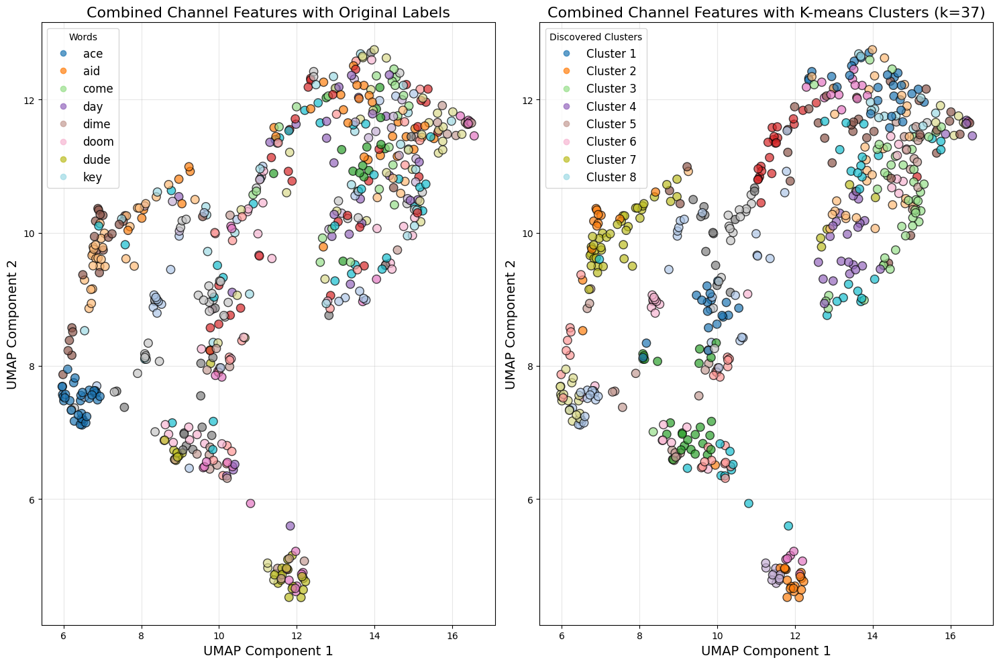

Adjusted Rand Index: 0.187
Normalized Mutual Information: 0.529


In [16]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.50, random_state=45)


# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Create visualization
plt.figure(figsize=(15, 10))

# Plot with original labels
plt.subplot(1, 2, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title("Combined Channel Features with Original Labels", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for original labels
handles, labels_auto = scatter1.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.legend(handles, labels, title="Words", loc="best", fontsize=12)

# Plot with predicted clusters
plt.subplot(1, 2, 2)
scatter2 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=clusters, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title(f"Combined Channel Features with K-means Clusters (k={num_classes})", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for clusters
handles, labels_auto = scatter2.legend_elements()
plt.legend(handles, [f"Cluster {i+1}" for i in range(len(handles))], 
           title="Discovered Clusters", loc="best", fontsize=12)

plt.tight_layout()
plt.savefig("dual_channel_clustering.png", dpi=300)
plt.show()

# Calculate and print clustering metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)

print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Normalized Mutual Information: {nmi:.3f}")

/home/nicolas/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7afefe36c720>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/l

Number of unique classes in the dataset: 37


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7aff8230ff60>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no 

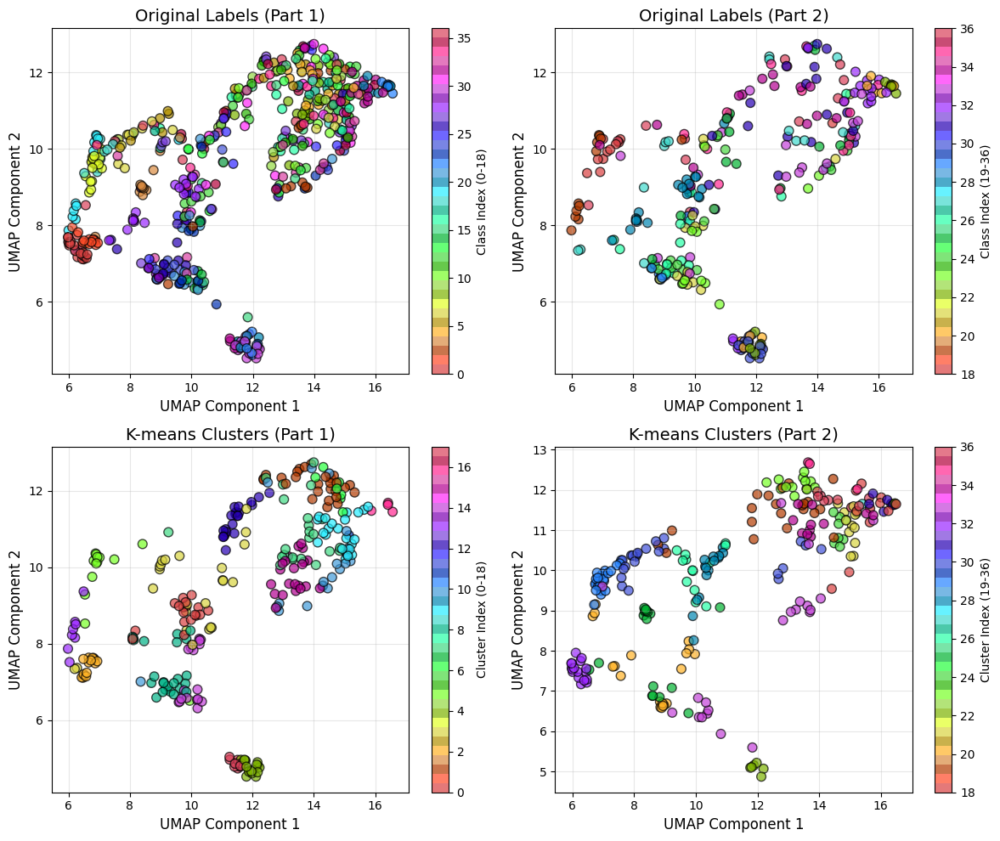

Adjusted Rand Index: 0.187
Normalized Mutual Information: 0.529


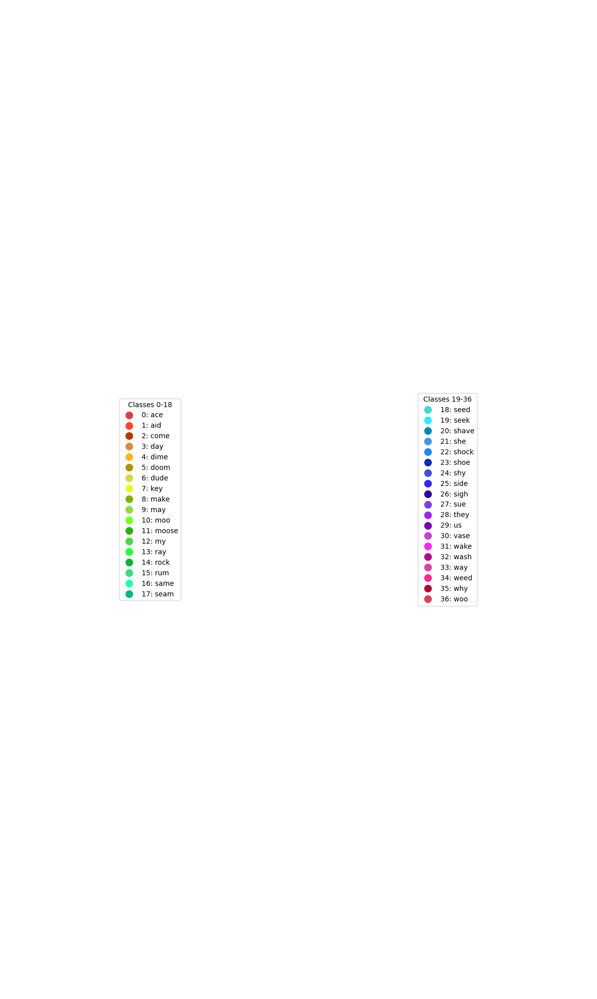

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from umap import UMAP

# Your existing code until the visualization part
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.50, random_state=45)

# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Generate a large set of distinct colors using hsv colorspace
def generate_distinct_colors(n):
    import colorsys
    colors = []
    for i in range(n):
        hue = i / n
        saturation = 0.7 + 0.3 * (i % 3) / 2  # Vary saturation
        value = 0.7 + 0.3 * ((i + 1) % 3) / 2  # Vary value/brightness
        colors.append(colorsys.hsv_to_rgb(hue, saturation, value))
    return colors

# Generate colors for all classes
distinct_colors = generate_distinct_colors(num_classes)
custom_cmap = ListedColormap(distinct_colors)

# Create 4 separate plots
plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded,
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"Original Labels (Part 1)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter1, label="Class Index (0-18)")

# Plot 2: Original Labels (Second half)
plt.subplot(2, 2, 2)
# Create a mask for the second half of classes
mask_high = np.logical_and(y_test_encoded >= num_classes//2, y_test_encoded < num_classes)
scatter2 = plt.scatter(
    X_umap_combined[mask_high, 0], 
    X_umap_combined[mask_high, 1], 
    c=y_test_encoded[mask_high],
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"Original Labels (Part 2)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter2, label=f"Class Index (19-{num_classes-1})")

# Plot 3: K-means Clusters (First half)
plt.subplot(2, 2, 3)
mask_low_cluster = np.logical_and(clusters >= 0, clusters < num_classes//2)
scatter3 = plt.scatter(
    X_umap_combined[mask_low_cluster, 0], 
    X_umap_combined[mask_low_cluster, 1], 
    c=clusters[mask_low_cluster],
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"K-means Clusters (Part 1)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter3, label="Cluster Index (0-18)")

# Plot 4: K-means Clusters (Second half)
plt.subplot(2, 2, 4)
mask_high_cluster = np.logical_and(clusters >= num_classes//2, clusters < num_classes)
scatter4 = plt.scatter(
    X_umap_combined[mask_high_cluster, 0], 
    X_umap_combined[mask_high_cluster, 1], 
    c=clusters[mask_high_cluster],
    cmap=custom_cmap,
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"K-means Clusters (Part 2)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter4, label=f"Cluster Index (19-{num_classes-1})")

plt.tight_layout()
plt.savefig("four_panel_clustering.png", dpi=300)
plt.show()

# Create a separate figure for the class legend (two columns)
plt.figure(figsize=(12, 20))
plt.subplot(1, 2, 1)
legend_elements1 = []
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
for i in range(num_classes//2):
    legend_elements1.append(plt.Line2D([0], [0], marker='o', color='w', 
                                     markerfacecolor=distinct_colors[i], markersize=12, 
                                     label=f"{i}: {labels[i]}"))
plt.legend(handles=legend_elements1, loc='center', fontsize=10, title="Classes 0-18")
plt.axis('off')

plt.subplot(1, 2, 2)
legend_elements2 = []
for i in range(num_classes//2, num_classes):
    legend_elements2.append(plt.Line2D([0], [0], marker='o', color='w', 
                                     markerfacecolor=distinct_colors[i], markersize=12, 
                                     label=f"{i}: {labels[i]}"))
plt.legend(handles=legend_elements2, loc='center', fontsize=10, title=f"Classes 19-{num_classes-1}")
plt.axis('off')

plt.tight_layout()
plt.savefig("classes_legend.png", dpi=300)

# Calculate and print clustering metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)
print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Normalized Mutual Information: {nmi:.3f}")

/home/nicolas/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7aff823580e0>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/l

Number of unique classes in the dataset: 37


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7aff449edb20>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no 

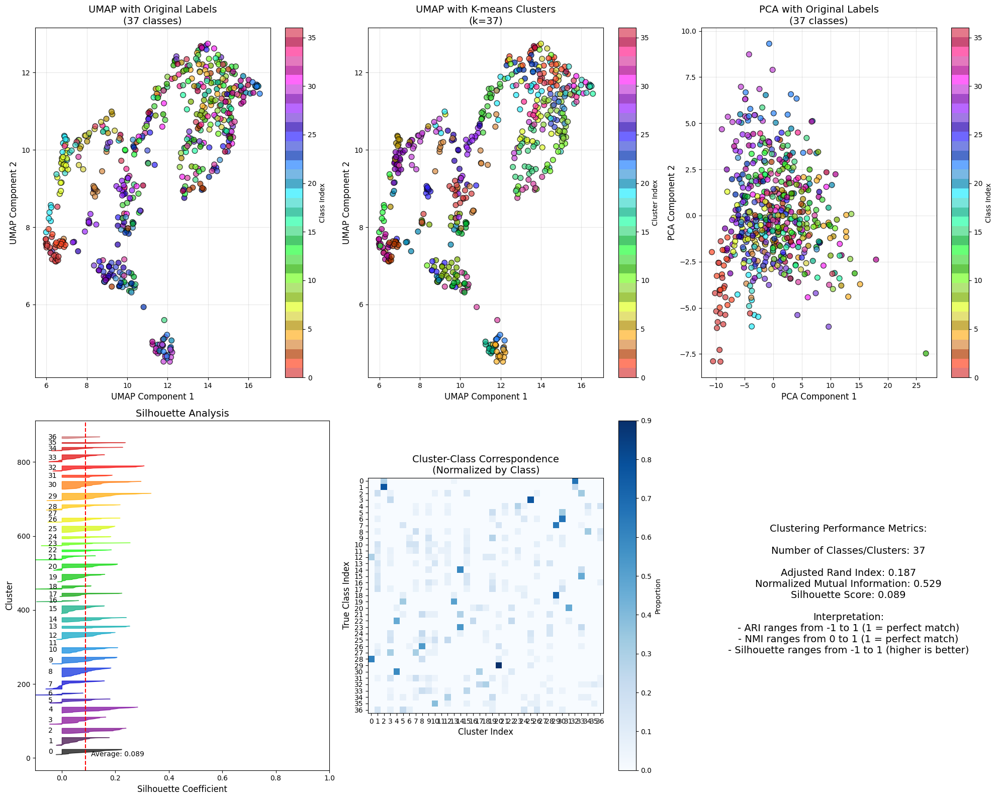

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from sklearn.decomposition import PCA
from umap import UMAP

# Your existing code until the visualization part
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.50, random_state=45)

# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Also perform PCA for comparison
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Generate distinct colors for all classes
def generate_distinct_colors(n):
    import colorsys
    colors = []
    for i in range(n):
        hue = i / n
        saturation = 0.7 + 0.3 * (i % 3) / 2
        value = 0.7 + 0.3 * ((i + 1) % 3) / 2
        colors.append(colorsys.hsv_to_rgb(hue, saturation, value))
    return colors

distinct_colors = generate_distinct_colors(num_classes)
custom_cmap = ListedColormap(distinct_colors)

# Calculate metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)
silhouette = silhouette_score(X_scaled, clusters) if len(np.unique(clusters)) > 1 else 0

# Set up the figure for all 5 graphs
plt.figure(figsize=(20, 16))

# Graph 1: UMAP with original labels
plt.subplot(2, 3, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded, 
    cmap=custom_cmap, 
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"UMAP with Original Labels\n({num_classes} classes)", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter1, label="Class Index")

# Graph 2: UMAP with K-means clusters
plt.subplot(2, 3, 2)
scatter2 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=clusters, 
    cmap=custom_cmap, 
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"UMAP with K-means Clusters\n(k={num_classes})", fontsize=14)
plt.xlabel("UMAP Component 1", fontsize=12)
plt.ylabel("UMAP Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter2, label="Cluster Index")

# Graph 3: PCA with original labels
plt.subplot(2, 3, 3)
scatter3 = plt.scatter(
    X_pca[:, 0], 
    X_pca[:, 1], 
    c=y_test_encoded, 
    cmap=custom_cmap, 
    edgecolor='k', 
    s=60, 
    alpha=0.7
)
plt.title(f"PCA with Original Labels\n({num_classes} classes)", fontsize=14)
plt.xlabel("PCA Component 1", fontsize=12)
plt.ylabel("PCA Component 2", fontsize=12)
plt.grid(True, alpha=0.3)
plt.colorbar(scatter3, label="Class Index")

# Graph 4: Silhouette analysis 
plt.subplot(2, 3, 4)
from sklearn.metrics import silhouette_samples

silhouette_values = silhouette_samples(X_scaled, clusters)
y_lower = 10

# Plot average silhouette score
plt.axvline(x=silhouette, color="red", linestyle="--")
plt.text(silhouette + 0.02, y_lower, f"Average: {silhouette:.3f}", 
         va='center', fontsize=10)

# Sample a subset for visualization if too many points
if len(clusters) > 500:
    sample_indices = np.random.choice(len(clusters), 500, replace=False)
    silhouette_subset = silhouette_values[sample_indices]
    clusters_subset = clusters[sample_indices]
    unique_clusters = np.unique(clusters_subset)
else:
    silhouette_subset = silhouette_values
    clusters_subset = clusters
    unique_clusters = np.unique(clusters)

for i in range(len(unique_clusters)):
    cluster_silhouette_values = silhouette_subset[clusters_subset == unique_clusters[i]]
    cluster_silhouette_values.sort()
    size_cluster_i = cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    
    color = plt.cm.nipy_spectral(float(i) / len(unique_clusters))
    plt.fill_betweenx(np.arange(y_lower, y_upper),
                      0, cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)
    
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(unique_clusters[i]), va='center')
    y_lower = y_upper + 10

plt.title("Silhouette Analysis", fontsize=14)
plt.xlabel("Silhouette Coefficient", fontsize=12)
plt.ylabel("Cluster", fontsize=12)
plt.xlim([-0.1, 1])
plt.tight_layout()

# Graph 5: Confusion matrix-like visualization
plt.subplot(2, 3, 5)
conf_mat = np.zeros((num_classes, num_classes))
for i in range(len(y_test_encoded)):
    conf_mat[y_test_encoded[i], clusters[i]] += 1

# Normalize by row
conf_mat_norm = conf_mat / conf_mat.sum(axis=1, keepdims=True)

plt.imshow(conf_mat_norm, interpolation='nearest', cmap='Blues')
plt.colorbar(label='Proportion')
plt.title("Cluster-Class Correspondence\n(Normalized by Class)", fontsize=14)
plt.xlabel("Cluster Index", fontsize=12)
plt.ylabel("True Class Index", fontsize=12)
plt.xticks(np.arange(num_classes), np.arange(num_classes))
plt.yticks(np.arange(num_classes), np.arange(num_classes))

# Add metrics text in the remaining space
plt.subplot(2, 3, 6)
plt.axis('off')
metrics_text = (
    f"Clustering Performance Metrics:\n\n"
    f"Number of Classes/Clusters: {num_classes}\n\n"
    f"Adjusted Rand Index: {ari:.3f}\n"
    f"Normalized Mutual Information: {nmi:.3f}\n"
    f"Silhouette Score: {silhouette:.3f}\n\n"
    f"Interpretation:\n"
    f"- ARI ranges from -1 to 1 (1 = perfect match)\n"
    f"- NMI ranges from 0 to 1 (1 = perfect match)\n"
    f"- Silhouette ranges from -1 to 1 (higher is better)\n"
)
plt.text(0.5, 0.5, metrics_text, ha='center', va='center', fontsize=14)

plt.tight_layout()
plt.savefig("clustering_five_graphs.png", dpi=300, bbox_inches='tight')
plt.show()

# Optional: Create a separate legend figure if needed
class_labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
if len(class_labels) <= 20:  # Only create if manageable number of classes
    plt.figure(figsize=(12, 10))
    legend_elements = []
    for i, label in enumerate(class_labels):
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', 
                                        markerfacecolor=distinct_colors[i], markersize=15, 
                                        label=f"{i}: {label}"))
    plt.axis('off')
    plt.legend(handles=legend_elements, loc='center', fontsize=12, ncol=3)
    plt.tight_layout()
    plt.savefig("class_legend.png", dpi=300)

/home/nicolas/anaconda3/lib/python3.11/site-packages/librosa/feature/spectral.py:2148: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


1100
(1100, 64)


/home/nicolas/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7aff84afcd60>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/l

Number of unique classes in the dataset: 37


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7aff84afcd60>
Traceback (most recent call last):
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/nicolas/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no 

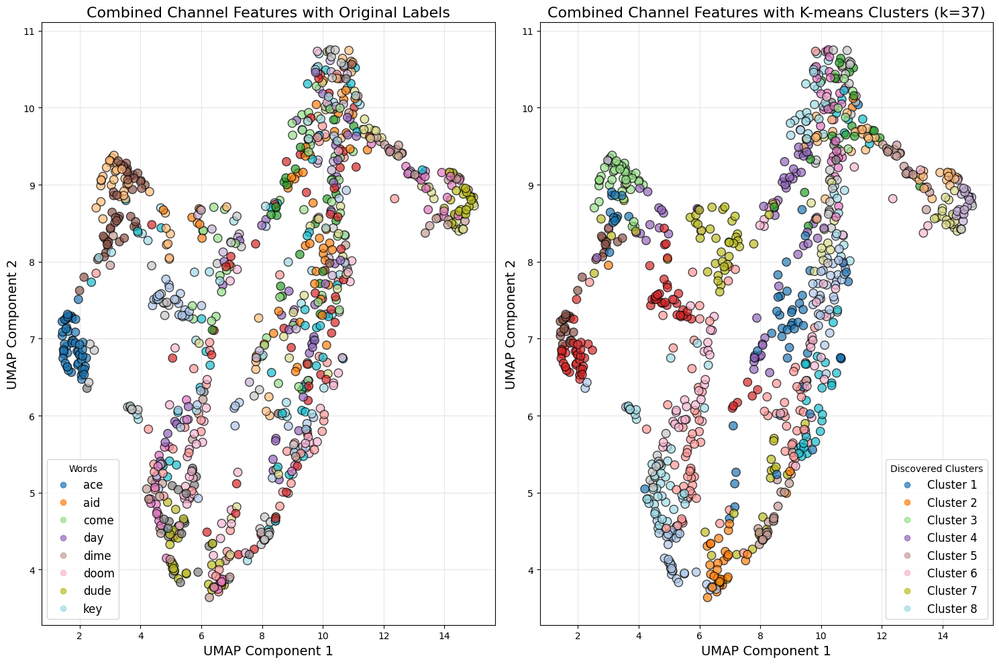

Adjusted Rand Index: 0.183
Normalized Mutual Information: 0.491


/home/nicolas/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/nicolas/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


ValueError: 'c' argument has 935 elements, which is inconsistent with 'x' and 'y' with size 550.

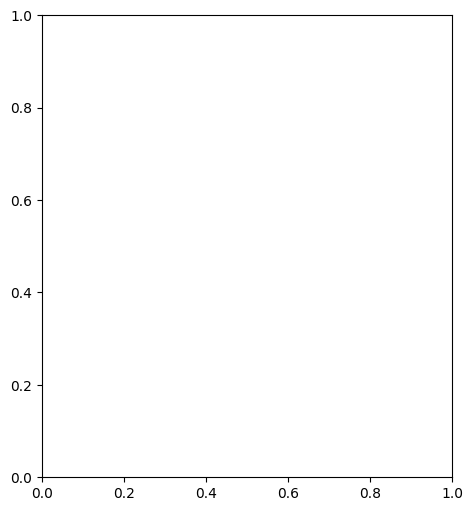

In [19]:


# Extract features from both channels
X_speech_channel1 = extract_speech_features(adc1segmentsX)
X_speech_channel2 = extract_speech_features(adc2segmentsX)
y = np.array(segmentsY)
print(len(adc1segmentsX))
print(X_speech_channel1.shape)
# print(X_speech_channel1[0][32:].mean())
# print(X_speech_channel1[1][32:].mean())
# print(X_speech_channel1[2][32:].mean())
# print(X_speech_channel1[20][32:].mean())
# print(X_speech_channel1[21][32:].mean())
# print(X_speech_channel1[22][32:].mean())
# Approach 1: Concatenate features from both channels
# This creates a feature vector with twice the dimensions
X_combined = np.hstack([X_speech_channel1, X_speech_channel2])
X_combined = X_speech_channel2


# Encode labels first
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Then split the data
X_train, X_test, y_train_encoded, y_test_encoded = train_test_split(
    X_combined, y_encoded, 
    test_size=0.85, 
    random_state=45,
    stratify=y_encoded  # Still use stratification
)
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test)

# UMAP for dimensionality reduction with both channels
umap_combined = UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='correlation',
    random_state=42
)
X_umap_combined = umap_combined.fit_transform(X_scaled)

# Get the number of classes from your existing labels
num_classes = len(np.unique(y_test_encoded))
print(f"Number of unique classes in the dataset: {num_classes}")

# Apply K-means with the number of clusters equal to number of classes
kmeans = KMeans(n_clusters=num_classes, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

# Create visualization
plt.figure(figsize=(15, 10))

# Plot with original labels
plt.subplot(1, 2, 1)
scatter1 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=y_test_encoded, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title("Combined Channel Features with Original Labels", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for original labels
handles, labels_auto = scatter1.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.legend(handles, labels, title="Words", loc="best", fontsize=12)

# Plot with predicted clusters
plt.subplot(1, 2, 2)
scatter2 = plt.scatter(
    X_umap_combined[:, 0], 
    X_umap_combined[:, 1], 
    c=clusters, 
    cmap='tab20', 
    edgecolor='k', 
    s=80, 
    alpha=0.7
)
plt.title(f"Combined Channel Features with K-means Clusters (k={num_classes})", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Add legend for clusters
handles, labels_auto = scatter2.legend_elements()
plt.legend(handles, [f"Cluster {i+1}" for i in range(len(handles))], 
           title="Discovered Clusters", loc="best", fontsize=12)

plt.tight_layout()
plt.savefig("dual_channel_clustering.png", dpi=300)
plt.show()

# Calculate and print clustering metrics
ari = adjusted_rand_score(y_test_encoded, clusters)
nmi = normalized_mutual_info_score(y_test_encoded, clusters)

print(f"Adjusted Rand Index: {ari:.3f}")
print(f"Normalized Mutual Information: {nmi:.3f}")

# -------------------------
# Alternative Approach: Create a comparison of individual channels vs combined
# -------------------------

# Scale individual channel features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
X_ch1_test = scaler1.fit_transform(X_speech_channel1[y_train.shape[0]:])  # Using same indices as test set
X_ch2_test = scaler2.fit_transform(X_speech_channel2[y_train.shape[0]:])  # Using same indices as test set

# print(X_speech_channel1.shape, X_speech_channel2.shape, X_combined.shape)

# UMAP for each individual channel
umap_ch1 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)
umap_ch2 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)

X_umap_ch1 = umap_ch1.fit_transform(X_ch1_test)
X_umap_ch2 = umap_ch2.fit_transform(X_ch2_test)

# Create 3-panel visualization comparing the channels
plt.figure(figsize=(18, 6))

# Channel 1
plt.subplot(1, 3, 1)
scatter1 = plt.scatter(X_umap_ch1[:, 0], X_umap_ch1[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 1 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Channel 2
plt.subplot(1, 3, 2)
scatter2 = plt.scatter(X_umap_ch2[:, 0], X_umap_ch2[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 2 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Combined channels
plt.subplot(1, 3, 3)
scatter3 = plt.scatter(X_umap_combined[:, 0], X_umap_combined[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Combined Channel Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.1)

# Add legend
handles, labels_auto = scatter3.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.figlegend(handles, labels, title="Words", loc="lower center", ncol=min(5, len(labels)), bbox_to_anchor=(0.5, 0), fontsize=12)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig("channel_comparison.png", dpi=300)
plt.show()

# Calculate clustering metrics for each approach to determine which is best
kmeans_ch1 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch1_test)
kmeans_ch2 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch2_test)

ari_ch1 = adjusted_rand_score(y_test_encoded, kmeans_ch1)
ari_ch2 = adjusted_rand_score(y_test_encoded, kmeans_ch2)
ari_combined = ari  # from earlier calculation

print("\nClustering Performance Comparison:")
print(f"Channel 1 only - ARI: {ari_ch1:.3f}")
print(f"Channel 2 only - ARI: {ari_ch2:.3f}")
print(f"Combined channels - ARI: {ari_combined:.3f}")
print("\nThe higher the ARI score (max 1.0), the better the clustering matches the true labels.")

/Users/samchin/mambaforge/envs/murmurations/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/samchin/mambaforge/envs/murmurations/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/Users/samchin/mambaforge/envs/murmurations/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/samchin/mambaforge/envs/murmurations/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


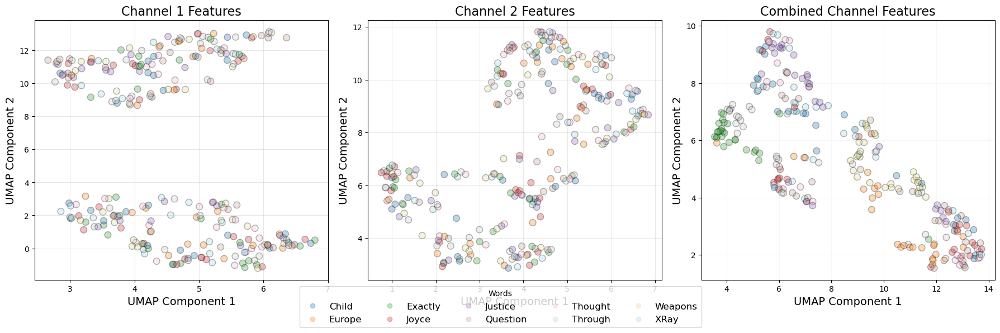


Clustering Performance Comparison:
Channel 1 only - ARI: -0.009
Channel 2 only - ARI: 0.008
Combined channels - ARI: 0.178

The higher the ARI score (max 1.0), the better the clustering matches the true labels.


In [ ]:
# -------------------------
# Alternative Approach: Create a comparison of individual channels vs combined
# -------------------------

# Scale individual channel features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
X_ch1_test = scaler1.fit_transform(X_speech_channel1[y_train.shape[0]:])  # Using same indices as test set
X_ch2_test = scaler2.fit_transform(X_speech_channel2[y_train.shape[0]:])  # Using same indices as test set

# print(X_speech_channel1.shape, X_speech_channel2.shape, X_combined.shape)

# UMAP for each individual channel
umap_ch1 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)
umap_ch2 = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)

X_umap_ch1 = umap_ch1.fit_transform(X_ch1_test)
X_umap_ch2 = umap_ch2.fit_transform(X_ch2_test)

# Create 3-panel visualization comparing the channels
plt.figure(figsize=(18, 6))

# Channel 1
plt.subplot(1, 3, 1)
scatter1 = plt.scatter(X_umap_ch1[:, 0], X_umap_ch1[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 1 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Channel 2
plt.subplot(1, 3, 2)
scatter2 = plt.scatter(X_umap_ch2[:, 0], X_umap_ch2[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Channel 2 Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.3)

# Combined channels
plt.subplot(1, 3, 3)
scatter3 = plt.scatter(X_umap_combined[:, 0], X_umap_combined[:, 1], c=y_test_encoded, cmap='tab20', edgecolor='k', s=70, alpha=0.3)
plt.title("Combined Channel Features", fontsize=16)
plt.xlabel("UMAP Component 1", fontsize=14)
plt.ylabel("UMAP Component 2", fontsize=14)
plt.grid(True, alpha=0.1)

# Add legend
handles, labels_auto = scatter3.legend_elements()
labels = label_encoder.inverse_transform(np.unique(y_test_encoded))
plt.figlegend(handles, labels, title="Words", loc="lower center", ncol=min(5, len(labels)), bbox_to_anchor=(0.5, 0), fontsize=12)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig("channel_comparison.png", dpi=300)
plt.show()

# Calculate clustering metrics for each approach to determine which is best
kmeans_ch1 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch1_test)
kmeans_ch2 = KMeans(n_clusters=num_classes, random_state=42, n_init=10).fit_predict(X_ch2_test)

ari_ch1 = adjusted_rand_score(y_test_encoded, kmeans_ch1)
ari_ch2 = adjusted_rand_score(y_test_encoded, kmeans_ch2)
ari_combined = ari  # from earlier calculation

print("\nClustering Performance Comparison:")
print(f"Channel 1 only - ARI: {ari_ch1:.3f}")
print(f"Channel 2 only - ARI: {ari_ch2:.3f}")
print(f"Combined channels - ARI: {ari_combined:.3f}")
print("\nThe higher the ARI score (max 1.0), the better the clustering matches the true labels.")